# GIK2FB Artificial Intelligence HT22

## Lab 4: ML - Supervised Regression Learning, Naive Bayes (Probabilistic Classifier)

Dalarna University
(c) Joonas Pääkkönen, fall 2022

### Deadline: Monday Dec 19th, 2022, 23:59 CET time

Upload your .ipynb file to Learn. No video, just the .ipynb file. Simply write your code in the .ipynb file and submit it. Do not zip anything, like the datasets, with it.

Use Scikit-learn first and foremost, with the help of Pandas, NumPy, SciPy, Matplotlib and Seaborn, if needed. Remember that Pandas dataframes come in very handy in data science.

Note: plotting pairplots may take several seconds or even minutes.

Make sure that your code runs before submitting.

Remember to fill in the information below, i.e., student name(s) and email address(es).

### Leandro Dominguez: model solutions

### h21ledom@du.se: model solutions

Good luck!

### Task 1: Linear regression

Task 1.1: Import Pandas, and download the hungary_chickenpox.csv dataset from
https://archive.ics.uci.edu/ml/datasets/Hungarian+Chickenpox+Cases and save the data into a variable called "chickendata" with the read.csv() method of the Pandas module.

In [208]:
%matplotlib inline
from sklearn.linear_model import LogisticRegression, LinearRegression, Ridge, Lasso
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np

chickendata = pd.read_csv("hungary_chickenpox.csv ")

Task 1.2: Print the chickendata dataset by simply writing the variable name.

In [209]:
chickendata

,Date,BUDAPEST,BARANYA,BACS,BEKES,BORSOD,CSONGRAD,FEJER,GYOR,HAJDU,...,JASZ,KOMAROM,NOGRAD,PEST,SOMOGY,SZABOLCS,TOLNA,VAS,VESZPREM,ZALA
0,03/01/2005,168,79,30,173,169,42,136,120,162,...,130,57,2,178,66,64,11,29,87,68
1,10/01/2005,157,60,30,92,200,53,51,70,84,...,80,50,29,141,48,29,58,53,68,26
2,17/01/2005,96,44,31,86,93,30,93,84,191,...,64,46,4,157,33,33,24,18,62,44
3,24/01/2005,163,49,43,126,46,39,52,114,107,...,63,54,14,107,66,50,25,21,43,31
4,31/01/2005,122,78,53,87,103,34,95,131,172,...,61,49,11,124,63,56,7,47,85,60
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
517,01/12/2014,95,12,41,6,39,0,16,15,14,...,56,7,13,122,4,23,4,11,110,10
518,08/12/2014,43,39,31,10,34,3,2,30,25,...,34,20,18,70,36,5,23,22,63,9
519,15/12/2014,35,7,15,0,0,0,7,7,4,...,30,36,4,72,5,21,14,0,17,10
520,22/12/2014,30,23,8,0,11,4,1,9,10,...,27,17,21,12,5,17,1,1,83,2


In [210]:
# Drop the original 'Date' column Causes an error later on
chickendata = chickendata.drop('Date', axis=1)



Task 1.3: Use the Pandas describe() method to describe chickendata.

In [211]:
chickendata.describe

<bound method NDFrame.describe of      BUDAPEST  BARANYA  BACS  BEKES  BORSOD  CSONGRAD  FEJER  GYOR  HAJDU  \
0         168       79    30    173     169        42    136   120    162   
1         157       60    30     92     200        53     51    70     84   
2          96       44    31     86      93        30     93    84    191   
3         163       49    43    126      46        39     52   114    107   
4         122       78    53     87     103        34     95   131    172   
..        ...      ...   ...    ...     ...       ...    ...   ...    ...   
517        95       12    41      6      39         0     16    15     14   
518        43       39    31     10      34         3      2    30     25   
519        35        7    15      0       0         0      7     7      4   
520        30       23     8      0      11         4      1     9     10   
521       259       42    49     32      38        15     11    98     61   

     HEVES  JASZ  KOMAROM  NOGRAD  PEST  

Task 1.4: Use Seaborn to plot the pairplot of the dataset.

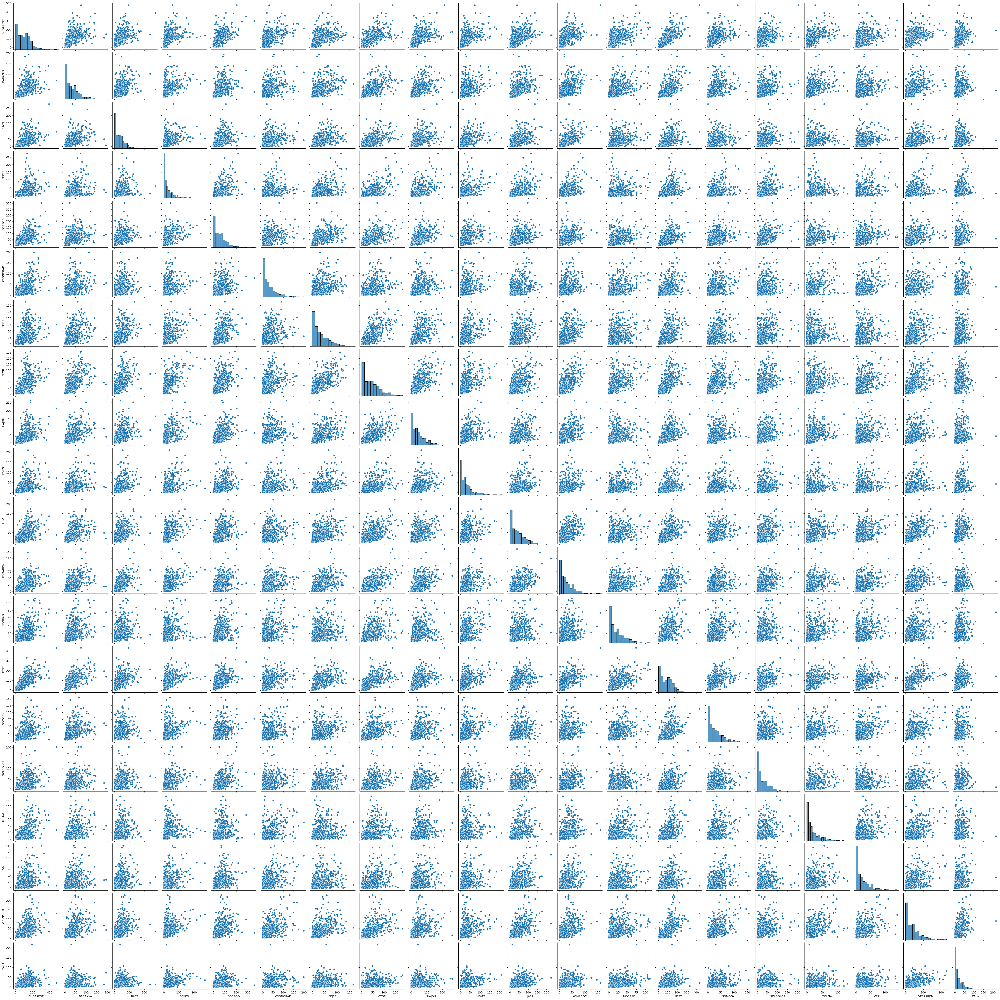

In [212]:
sns.pairplot(chickendata)

Task 1.5: Use the scatterplot() method of Seaborn to plot a scatterplot where the x-coordinates are from the BUDAPEST column and the y-coordinates are from the VAS column.

<AxesSubplot:xlabel='BUDAPEST', ylabel='VAS'>

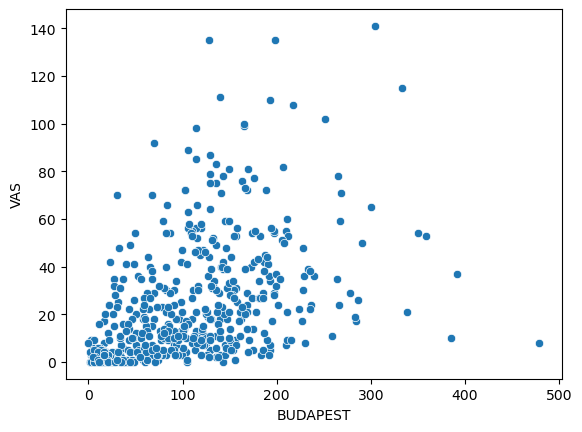

In [213]:
sns.scatterplot(x='BUDAPEST', y='VAS', data=chickendata)

Task 1.6: Use Scikit-learn to fit a simple linear OLS regression line to the data visualized in Task 1.5. Plot the linear regression line alongside the scatterplot of Task 1.5. Make sure the line and the scatterplot points are in different colors. Note: you may need to reshape the data first.

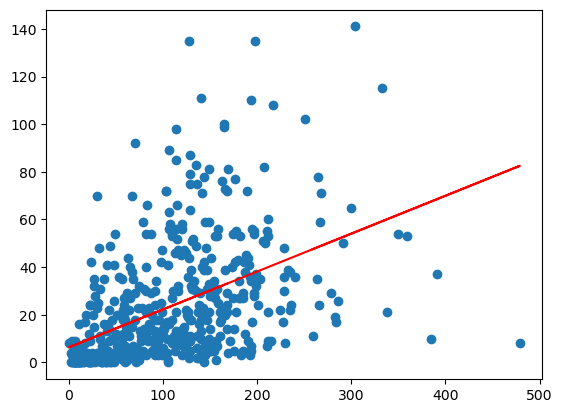

In [214]:
# Prepare data
X = chickendata['BUDAPEST'].values.reshape(-1, 1)
y = chickendata['VAS'].values

# Create scatterplot
plt.scatter(X, y)

# Create and fit model
logreg = LinearRegression()
logreg.fit(X, y)

# Make predictions and plot on scatterplot
y_pred = logreg.predict(X)
plt.plot(X, y_pred, color='red')

Task 1.7: What is the value of the coefficient of determination for the linear regression model of Task 1.6?

In [215]:
r_squared = model.score(X, y)
print(f'R^2: {r_squared}')

R^2: 0.2356501580146917


Task 1.8: Use Scikit-learn to fit an ordinary least squares linear regression model to predict the values of the BUDAPEST column with all the other data columns of the chickendata dataset, not only with the VAS column. Find the $R^2$-value for the prediction. Similarly, fit a Ridge regression model and also a LASSO regression model to the same data. Find the corresponding $R^2$-values for these two models as you did for the simple linear regression model. That is, you need to print all the three coefficients of determination to pass this task.

In [216]:
# Prepare the data
X = chickendata.drop('BUDAPEST', axis=1)
y = chickendata['BUDAPEST']

# Fit and predict with OLS model
ols_model = LinearRegression()
ols_model.fit(X, y)
y_pred = ols_model.predict(X)
ols_r_squared = ols_model.score(X, y)
print(f'OLS R^2: {ols_r_squared}')

# Fit and predict with Ridge model
ridge_model = Ridge(alpha=1)
ridge_model.fit(X, y)
y_pred = ridge_model.predict(X)
ridge_r_squared = ridge_model.score(X, y)
print(f'Ridge R^2: {ridge_r_squared}')

# Fit and predict with Lasso model
lasso_model = Lasso(alpha=1)
lasso_model.fit(X, y)
y_pred = lasso_model.predict(X)
lasso_r_squared = lasso_model.score(X, y)
print(f'Lasso model R^2: {lasso_r_squared}')

OLS R^2: 0.7203360896133673
Ridge R^2: 0.720336089611325
Lasso model R^2: 0.7203244935638704


Task 1.9: Now you have three different models and three different $R^2$-values. In terms of the $R^2$-value, which model performs the best? How would you comment these results in your own words? Enter your answer here:

In this case, it appears that all three models perform almost equally well in terms of the R^2 value. With R^2 values of around 0.721

Here we have the highest value to the lowest

OLS   : 0.7203360896133673

Ridge : 0.720336089611325

Lasso : 0.7203244935638704


A model with a higher R2 value is typically thought to have a better fit since a higher R2 value shows that the model can explain more of the variance in the data. So i would say that the OLS Model slightly preformed better than the rest but not by much.



### Task 2: Binary classification with logistic regression and Gaussian Naive Bayes

Task 2.1: Download the DryBeanDataset.zip file from
https://archive.ics.uci.edu/ml/datasets/Dry+Bean+Dataset and save Dry_Bean_Dataset.xlsx to variable "beandata". You need to read an .xlsx file now.

In [217]:
beandata = pd.read_excel("Dry_Bean_Dataset.xlsx ")

In [218]:
beandata.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13611 entries, 0 to 13610
Data columns (total 17 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Area             13611 non-null  int64  
 1   Perimeter        13611 non-null  float64
 2   MajorAxisLength  13611 non-null  float64
 3   MinorAxisLength  13611 non-null  float64
 4   AspectRation     13611 non-null  float64
 5   Eccentricity     13611 non-null  float64
 6   ConvexArea       13611 non-null  int64  
 7   EquivDiameter    13611 non-null  float64
 8   Extent           13611 non-null  float64
 9   Solidity         13611 non-null  float64
 10  roundness        13611 non-null  float64
 11  Compactness      13611 non-null  float64
 12  ShapeFactor1     13611 non-null  float64
 13  ShapeFactor2     13611 non-null  float64
 14  ShapeFactor3     13611 non-null  float64
 15  ShapeFactor4     13611 non-null  float64
 16  Class            13611 non-null  object 
dtypes: float64(1

Task 2.2: Print the beandata dataset by simply writing the variable name.

In [219]:
beandata

,Area,Perimeter,MajorAxisLength,MinorAxisLength,AspectRation,Eccentricity,ConvexArea,EquivDiameter,Extent,Solidity,roundness,Compactness,ShapeFactor1,ShapeFactor2,ShapeFactor3,ShapeFactor4,Class
0,28395,610.291,208.178117,173.888747,1.197191,0.549812,28715,190.141097,0.763923,0.988856,0.958027,0.913358,0.007332,0.003147,0.834222,0.998724,SEKER
1,28734,638.018,200.524796,182.734419,1.097356,0.411785,29172,191.272750,0.783968,0.984986,0.887034,0.953861,0.006979,0.003564,0.909851,0.998430,SEKER
2,29380,624.110,212.826130,175.931143,1.209713,0.562727,29690,193.410904,0.778113,0.989559,0.947849,0.908774,0.007244,0.003048,0.825871,0.999066,SEKER
3,30008,645.884,210.557999,182.516516,1.153638,0.498616,30724,195.467062,0.782681,0.976696,0.903936,0.928329,0.007017,0.003215,0.861794,0.994199,SEKER
4,30140,620.134,201.847882,190.279279,1.060798,0.333680,30417,195.896503,0.773098,0.990893,0.984877,0.970516,0.006697,0.003665,0.941900,0.999166,SEKER
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13606,42097,759.696,288.721612,185.944705,1.552728,0.765002,42508,231.515799,0.714574,0.990331,0.916603,0.801865,0.006858,0.001749,0.642988,0.998385,DERMASON
13607,42101,757.499,281.576392,190.713136,1.476439,0.735702,42494,231.526798,0.799943,0.990752,0.922015,0.822252,0.006688,0.001886,0.676099,0.998219,DERMASON
13608,42139,759.321,281.539928,191.187979,1.472582,0.734065,42569,231.631261,0.729932,0.989899,0.918424,0.822730,0.006681,0.001888,0.676884,0.996767,DERMASON
13609,42147,763.779,283.382636,190.275731,1.489326,0.741055,42667,231.653248,0.705389,0.987813,0.907906,0.817457,0.006724,0.001852,0.668237,0.995222,DERMASON


Task 2.3: Use the describe() method to describe the dataset.

In [220]:
beandata.describe()

,Area,Perimeter,MajorAxisLength,MinorAxisLength,AspectRation,Eccentricity,ConvexArea,EquivDiameter,Extent,Solidity,roundness,Compactness,ShapeFactor1,ShapeFactor2,ShapeFactor3,ShapeFactor4
count,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000
mean,53048.284549,855.283459,320.141867,202.270714,1.583242,0.750895,53768.200206,253.064220,0.749733,0.987143,0.873282,0.799864,0.006564,0.001716,0.643590,0.995063
std,29324.095717,214.289696,85.694186,44.970091,0.246678,0.092002,29774.915817,59.177120,0.049086,0.004660,0.059520,0.061713,0.001128,0.000596,0.098996,0.004366
min,20420.000000,524.736000,183.601165,122.512653,1.024868,0.218951,20684.000000,161.243764,0.555315,0.919246,0.489618,0.640577,0.002778,0.000564,0.410339,0.947687
25%,36328.000000,703.523500,253.303633,175.848170,1.432307,0.715928,36714.500000,215.068003,0.718634,0.985670,0.832096,0.762469,0.005900,0.001154,0.581359,0.993703
50%,44652.000000,794.941000,296.883367,192.431733,1.551124,0.764441,45178.000000,238.438026,0.759859,0.988283,0.883157,0.801277,0.006645,0.001694,0.642044,0.996386
75%,61332.000000,977.213000,376.495012,217.031741,1.707109,0.810466,62294.000000,279.446467,0.786851,0.990013,0.916869,0.834270,0.007271,0.002170,0.696006,0.997883
max,254616.000000,1985.370000,738.860153,460.198497,2.430306,0.911423,263261.000000,569.374358,0.866195,0.994677,0.990685,0.987303,0.010451,0.003665,0.974767,0.999733


Task 2.4: What is the range (the difference between the maximum and the minimum) of the Area feature?

In [221]:
range = beandata['Area'].max() - beandata['Area'].min()

range

234196

Task 2.5: Use Seaborn to plot the pairplots of the dataset with the hue argument set to the class of the bean. Note that there are several kinds of beans. Follow the link in Task 2.1 if you want to read more details about the data.

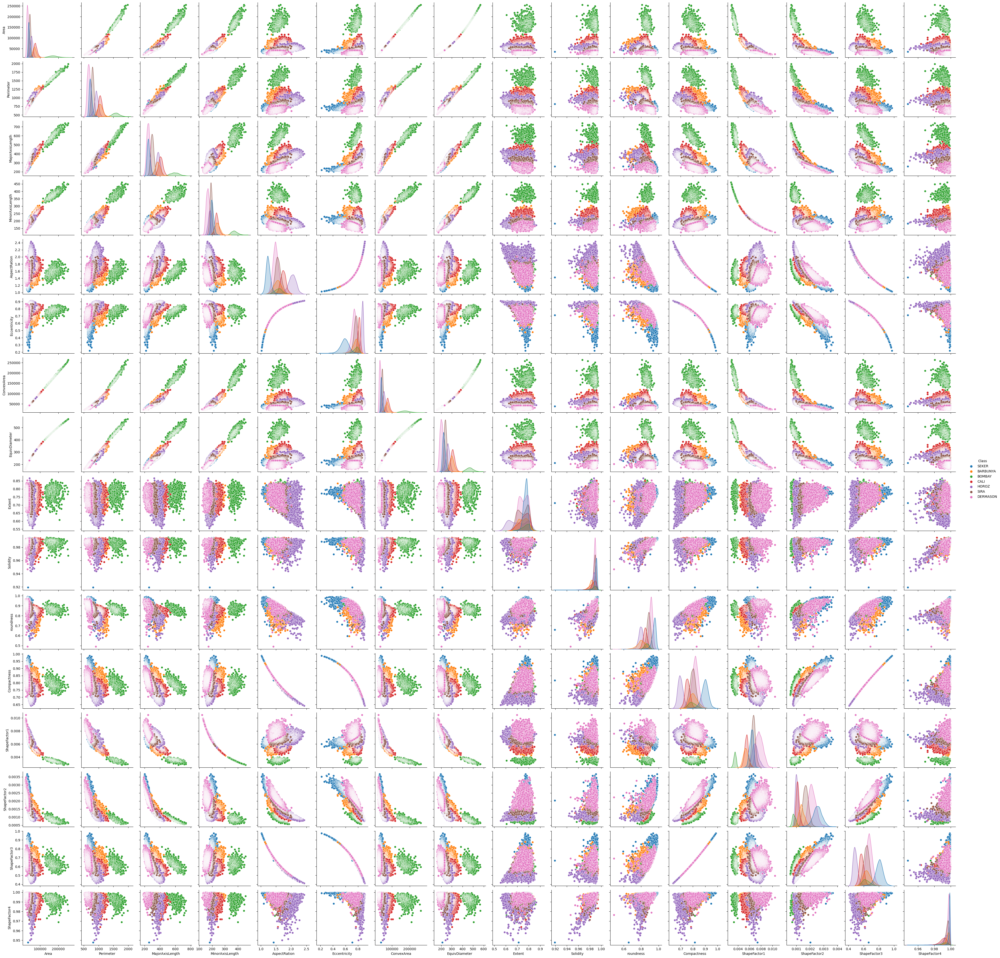

In [222]:
sns.pairplot(beandata, hue='Class')



Task 2.6: Imagine that you were to use a regression model to predict the Eccentricity feature as the regression target variable with the AspectRation feature as the independent variable. By looking at the corresponding pairplot above, what type of a regression model would you choose? Motivate your answer in your own words.

Bonus: If you want, you can also apply the regression model of your choice here and plot the results, but this is not compulsory. Nonetheless, executing this bonus task can compensate for some shortcomings in the other tasks.

-

Based on the pairplot, it looks like there is a nonlinear relationship between the Eccentricity feature and the AspectRatio feature In this case, a linear regression model might not be the best choice because it assumes a linear relationship between the dependent and independent variables. Instead, a nonlinear model such as a decision tree might be more appropriate. 

Decision trees are a type of machine learning algorithm that can also handle nonlinear relationships. They work by dividing the feature space into regions and making predictions based on the characteristics of the data points in each region.

Decision trees are capable of handling nonlinear interactions. They operate by segmenting the feature space into regions and creating predictions based on the characteristics of the data points in each region. This might be a more suitable approach.

-

Task 2.7: Let's say we are only interested in Bombay beans. Use Scikit-learn to build a logistic regression predictor based on the major axis length of the beans to separate Bombay beans from other beans. Plot the regression curve in the same figure with the corresponding scatterplot.

In [223]:
# NOTE- Looking at this now im not using the major axis length of the beans to separate Bombay beans from other beans. Need to figure that out.

beandata = pd.get_dummies(beandata, drop_first=True)

beandata.sample(5)

,Area,Perimeter,MajorAxisLength,MinorAxisLength,AspectRation,Eccentricity,ConvexArea,EquivDiameter,Extent,Solidity,...,ShapeFactor1,ShapeFactor2,ShapeFactor3,ShapeFactor4,Class_BOMBAY,Class_CALI,Class_DERMASON,Class_HOROZ,Class_SEKER,Class_SIRA
12063,32826,676.327,263.115387,159.120732,1.653558,0.796410,33130,204.439138,0.815593,0.990824,...,0.008015,0.001802,0.603720,0.998286,0,0,1,0,0,0
6494,54085,940.816,389.931046,177.605736,2.195487,0.890246,54839,262.417912,0.600198,0.986251,...,0.007210,0.000912,0.452909,0.994357,0,0,0,1,0,0
11238,29709,639.387,238.927098,158.743936,1.505110,0.747374,29986,194.490806,0.721618,0.990762,...,0.008042,0.002178,0.662624,0.997322,0,0,1,0,0,0
13458,40320,744.009,282.373474,182.175021,1.550012,0.764051,40675,226.576739,0.810257,0.991272,...,0.007003,0.001791,0.643847,0.997971,0,0,1,0,0,0
6323,52452,878.032,342.150856,198.784235,1.721217,0.813915,53647,258.425929,0.675362,0.977725,...,0.006523,0.001310,0.570475,0.981912,0,0,0,1,0,0


Accuracy: 0.9985307081986482


C:\Users\Leandro\anaconda3\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but LogisticRegression was fitted with feature names
  warnings.warn(


Text(0, 0.5, 'Class_BOMBAY')

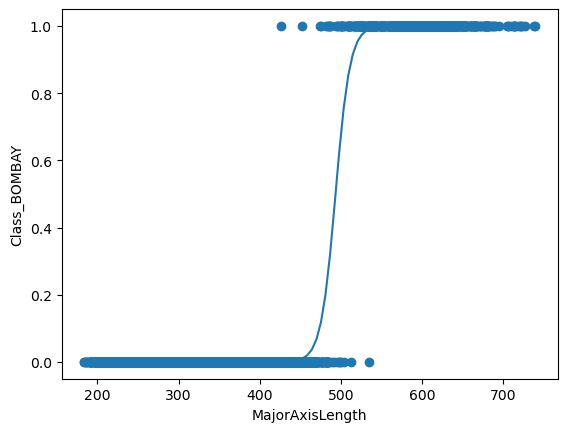

In [224]:
# Select the MajorAxisLength column as the feature and the Class column as the target
X = beandata[['MajorAxisLength']]

y = beandata['Class_BOMBAY']

# Split the data into a training set and a test set
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=16)

# Create a logistic regression model
logreg = LogisticRegression(random_state=16)

# Fit the model to the training data
logreg.fit(X_train, y_train)

# Make predictions on the test data
y_pred = logreg.predict(X_test)

# Compute the accuracy of the model on the test data
accuracy = logreg.score(X_test, y_test)
print('Accuracy:', accuracy)

# Plot the scatterplot of the MajorAxisLength feature and the Class target
plt.scatter(X, y)

# Plot the logistic regression curve
x_plot = np.linspace(X.min(), X.max(), 100)
y_plot = logreg.predict_proba(x_plot.reshape(-1, 1))[:, 1]
plt.plot(x_plot, y_plot)

plt.xlabel('MajorAxisLength')
plt.ylabel('Class_BOMBAY')


Task 2.8: Use the score() method to evaluate the accuracy of the model.

In [225]:
accuracy = logreg.score(X_test, y_test)
print('Accuracy:', accuracy)

Accuracy: 0.9985307081986482


Task 2.9: How would you describe the accuracy value? Write your answer in your own words here:

The score indicates that the model can accurately predict the category of beans. The value shows that the beans' major axis length is a valid predictor what type of bean it is. The logistic regression model is capable of capturing the association between this characteristic and the target variable.

-

Task 2.10: Let's say we are still only interested in the Bombay beans of Task 2. Use Scikit-learn to build a Gaussian Naive Bayes (GaussianNB) predictor based on the major axis length of the beans to separate Bombay beans from other beans. Plot the regression curve in the same figure with the corresponding scatterplot. That is, repeat Task 2.7 but this time with the GaussianNB classifier.

Accuracy: 0.9982368498383779


C:\Users\Leandro\anaconda3\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but GaussianNB was fitted with feature names
  warnings.warn(


Text(0, 0.5, 'Class_BOMBAY')

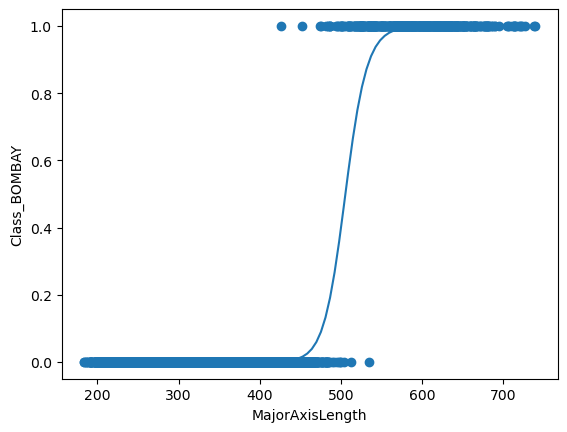

In [226]:
from sklearn.naive_bayes import GaussianNB

# Select the MajorAxisLength column as the feature and the Class column as the target
X = beandata[['MajorAxisLength']]

y = beandata['Class_BOMBAY']

# Split the data into a training set and a test set
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=16)

# Create a Gaussian Naive Bayes model
gnb = GaussianNB()

# Fit the model to the training data
gnb.fit(X_train, y_train)

# Make predictions on the test data
y_pred = gnb.predict(X_test)

# Compute the accuracy of the model on the test data
accuracy = gnb.score(X_test, y_test)
print('Accuracy:', accuracy)

# Plot the scatterplot of the MajorAxisLength feature and the Class target
plt.scatter(X, y)

x_plot = np.linspace(X.min(), X.max(), 100)
y_plot = gnb.predict_proba(x_plot.reshape(-1, 1))[:, 1]
plt.plot(x_plot, y_plot)

plt.xlabel('MajorAxisLength')
plt.ylabel('Class_BOMBAY')


Task 2.11: Use the score() method to evaluate the accuracy of the GaussianNB model.

In [227]:
accuracy = gnb.score(X_test, y_test)
print('Accuracy:', accuracy)        

Accuracy: 0.9982368498383779


Task 2.12: How many beans did the classifier misclassify?

In [228]:
num_misclassified = (y_test != y_pred).sum()
procent_misclassified = (1- accuracy)
print('Number of misclassified beans:', num_misclassified)
print('Procentage of misclassified beans:', procent_misclassified)

Number of misclassified beans: 6
Procentage of misclassified beans: 0.0017631501616220957


Task 2.13: How would you comment the results in your own words? Compare the logistic regression model and the Gaussian Naive Bayes model performance. Write your answer in your own words here:

Both models seem to have performed very well. The logistic regression model did get a slightly higher score but not by much. It is challenging to provide a more thorough assessment of the performance of the models without doing more aswell as different tests.